<a href="https://colab.research.google.com/github/gyulimjessKang/Predicting-Dog-Breeds/blob/main/end_to_end_dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end multiclass dog breed identification
This notebook builds an end-to-end multiclass image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given an image of a dog.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:
* We're dealing with images (unstructured data), so it's probably best we use deep learning/transfer learning
* 120 different classes (breeds of dogs)
* There are around 10,000+ images in both the test and training sets (the images in the former will have no labels)

### Prepare workspace
* Import key libraries and TensorFlow
* Import TensorFlow Hub
* Make sure we're using a GPU

In [2]:
import numpy as np
import pandas as pd
import sklearn

# Import TensorFlow
import os
os.environ["TF_USE_LEGACY_KERAS"] = "1"

import tensorflow as tf

# Import TensorFlow Hub
import tensorflow_hub as hub
print("TF Hub version: " + hub.__version__)

import tf_keras

TF Hub version: 0.16.1


In [3]:
# Check for GPU availability
print("GPU success!" if tf.config.list_physical_devices("GPU") else "GPU not available :(")

GPU success!


## Getting our data ready by turning it into Tensors

With all machine learning models, our data has to be in numerical format. The first step here is to turn our images into Tensors (numerical representation).

We'll start by accessing our data and checking the labels.

In [4]:
# See data labels
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


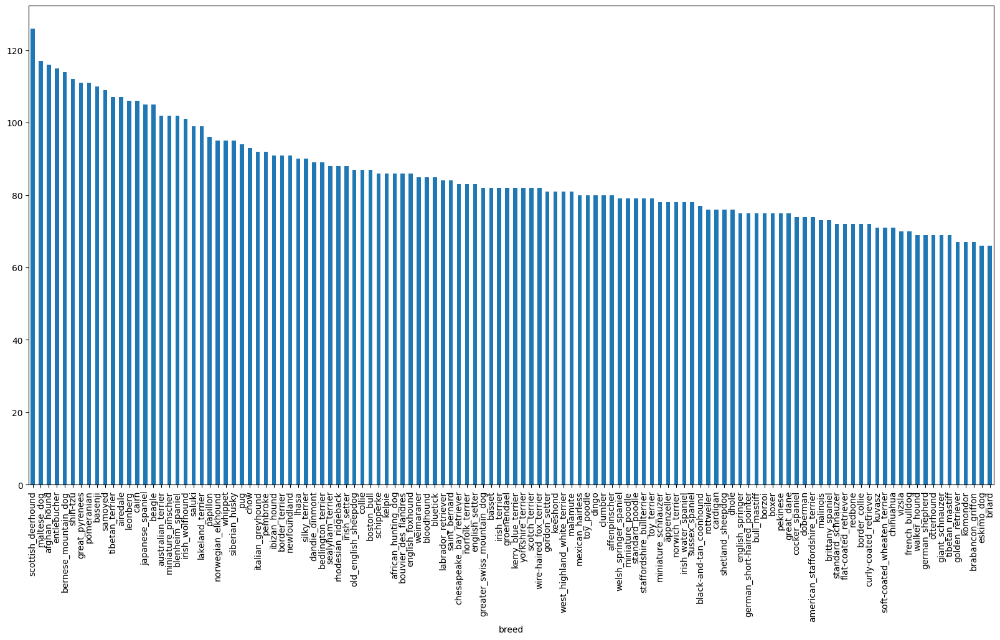

In [5]:
# How many images are there of each breed?
labels_csv.breed.value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv.breed.value_counts().median()

82.0

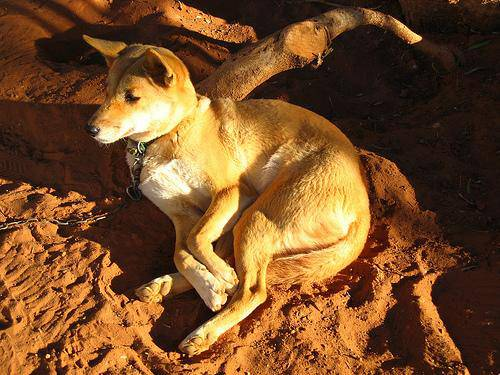

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
We'll get a list of all our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 

In [ ]:
# Check whether number of file names matches the number of image files
import os
if len(os.listdir("drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train")) == len(filenames):
  print("True. Filenames match actual amount of files. Proceed!")
else:
  print("False. Filenames don't match actual amount of files. Check target directory.")

True. Filenames match actual amount of files. Proceed!


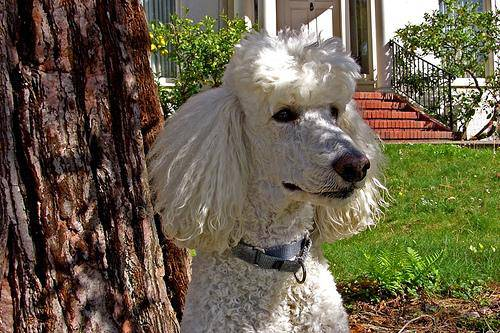

In [ ]:
# One more check
Image(filenames[8723])

Since we've got the training image filepaths in a list, we'll start preparing our labels.

In [ ]:
labels = np.array(labels_csv["breed"])
# labels = labels_csv["breed"].to_numpy() does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(labels) == len(filenames):
  print("Success! Number of labels matches number of filenames.")
else:
  print("False, number of labels doesn't match number of filenames.")

Success! Number of labels matches number of filenames.


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn every label into an array of booleans (one-hot encoding)
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

### Creating our own validation set

In [ ]:
# Set up X & y variables
X = filenames
y = boolean_labels

We're going to start off with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min: 1000, max: 10000}

In [ ]:
# Split data into train and validation of total size NUM_IMAGES
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fals

## Preprocessing images (turning images into Tensors)

To preprocess, we're going to write a function that does the following:
1. Take an image filepath as input
2. Use TF to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
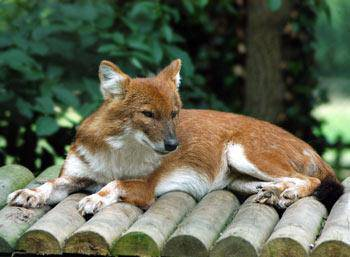

In [ ]:
image

In [ ]:
# Turn image into a Tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now, let's make our function to preprocess images and convert them into Tensors.

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numeric Tensor with three color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values (normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize image to our desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

## Turning our data into batches

We turn our data into batches to improve efficiency. Otherwise, the data may not all fit into memory.

We will convert our data into Tensor tuples: `(image, label)`.

In [ ]:
# Create a function to return a tuple of Tensors
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image, and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Define batch size
BATCH_SIZE = 32

# Create a function to turn all of our data X & y into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If data is a test dataset, we likely don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(batch_size)

    return data_batch

  # If data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(batch_size)

    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping (faster to shuffle filenames than Tensors)
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (function also processes image)
    data_batch = data.map(get_image_label).batch(batch_size)

  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check different attributes of the created batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

Our data is now in batches; however, these can be tricky to visualize and comprehend. Let's visualize!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Set up the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 images/labels
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i + 1)
    # Display an image
    plt.imshow(images[i])
    # Add image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.25044778, 0.2843761 , 0.2633235 ],
          [0.22802529, 0.292311  , 0.25929138],
          [0.27421477, 0.37416226, 0.32838497],
          ...,
          [0.45255503, 0.40178707, 0.37347588],
          [0.34244612, 0.34202677, 0.35984972],
          [0.3529626 , 0.36472732, 0.39473435]],
 
         [[0.21359482, 0.26479408, 0.2269257 ],
          [0.26374754, 0.33315858, 0.28720272],
          [0.6253304 , 0.71142983, 0.66072434],
          ...,
          [0.5372959 , 0.49491313, 0.47896254],
          [0.39542812, 0.401687  , 0.38170272],
          [0.33963498, 0.3591991 , 0.33594242]],
 
         [[0.33355588, 0.41861248, 0.35597244],
          [0.3708933 , 0.4503593 , 0.38817796],
          [0.6441096 , 0.70351666, 0.6467736 ],
          ...,
          [0.33889848, 0.3129006 , 0.3097289 ],
          [0.3404808 , 0.33935872, 0.37842563],
          [0.3899348 , 0.3975591 , 0.44952852]],
 
         ...,
 
         [[0.49208096, 0.62911737, 0.52367204],
          [0.47661

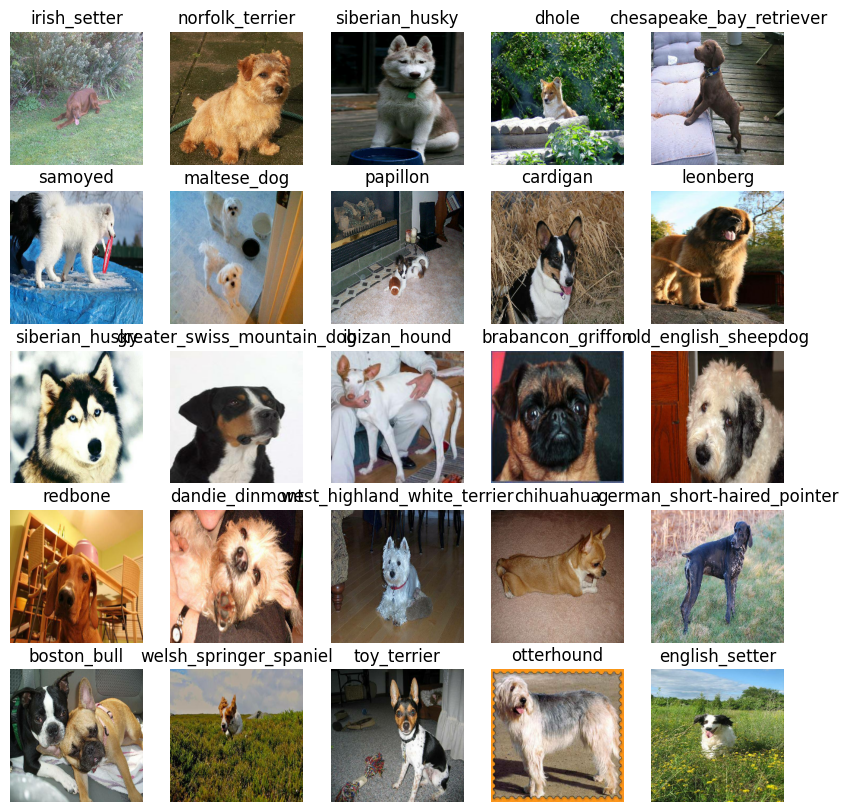

In [ ]:
show_25_images(train_images, train_labels)

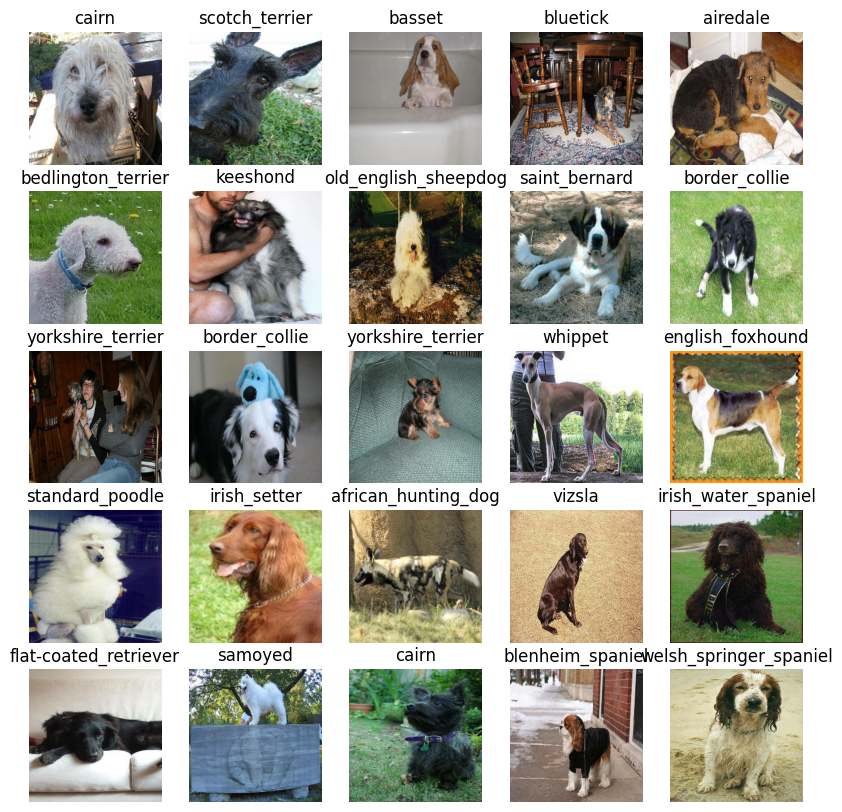

In [ ]:
# Now we'll visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model
* The output shape (our labels shape, in the form of Tensors) of our model
* The URL of the model we want to use from TensorFlow Hub

In [ ]:
# Set up input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Set up output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Set up model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true"

We'll now combine our prepared inputs, outputs, and models into a Keras deep learning model.

We will create a function which does the following:
* Takes the input shape, output shape, and model we've chosen as parameters.
* Defines the layers in a Keras model in a sequential fashion.
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  """
  Creates a model by loading model from 'model_url', then specifying input shape ('input_shape') and output shape ('output_shape')
  """
  print("Building model with: " + MODEL_URL)

  # Set up the model layers
  model = tf_keras.Sequential([
      hub.KerasLayer(model_url), # Layer 1 (input layer)
      tf_keras.layers.Dense(units=output_shape, # Layer 2 (output layer)
                            activation="softmax")
  ])

  # Compile the model

  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(), # The model wants to reduce this
      optimizer=tf_keras.optimizers.Adam(), # Tells the model how to improve its guesses
      metrics=["accuracy"] # Tells the model how it's being evaluated (we'd like this to go UP)
  )

  # Build the model
  model.build(input_shape) # Tells the model the input shape

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as saving progress, checking progress, or stopping early to prevent overfitting.

We'll create two callbacks: one for Tensorboard (which tracks the model's progress) and another for early stopping.

### TensorBoard callback

To set up a Tensorboard callback, we need to do 3 things:
1. Load TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
   # Create a log directory for storing TensorBoard logs
   logdir = os.path.join("drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/logs",
                         # Make it so the logs get tracke whenever we run an experiment
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
   return tf_keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps prevent overfitting by stopping training if a certain metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data)

This first model is only going to train on 1000 images to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param{type:"slider", min:10, max:100, step:10}

We'll create a function to train a model that does the following:
* Create a model using `create_model()`
* Set up a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training/validation data, number of epochs to train for (`NUM_EPOCHS) and the callbacks we want to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()
  # Create new TensorBoard session every time we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data, passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true
Epoch 1/100
25/25 [==============================] - 207s 8s/step - loss: 4.5351 - accuracy: 0.0988 - val_loss: 3.3423 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 6s 223ms/step - loss: 1.5882 - accuracy: 0.7038 - val_loss: 2.1153 - val_accuracy: 0.5450
Epoch 3/100
25/25 [==============================] - 5s 213ms/step - loss: 0.5545 - accuracy: 0.9375 - val_loss: 1.6663 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 4s 161ms/step - loss: 0.2522 - accuracy: 0.9900 - val_loss: 1.4760 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 5s 205ms/step - loss: 0.1448 - accuracy: 0.9975 - val_loss: 1.4185 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 5s 213ms/step - loss: 0.0989 - accuracy: 1.0000 - val_loss: 1.3701 - val_accuracy: 0.6300
Epoch 7/100
25/

**Question**: What are some ways to prevent model overfitting in deep learning neural networks?

Key to remember is that model overfitting in the BEGINNING is a good thing; it means the model is learning.

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/logs

<IPython.core.display.Javascript object>

## Making predictions and evaluating using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 119ms/step


array([[1.78169727e-03, 1.21799174e-04, 2.93597882e-03, ...,
        9.41481121e-05, 1.84938508e-05, 4.29312279e-03],
       [4.81343409e-03, 7.78222864e-04, 4.56351740e-03, ...,
        7.25798658e-04, 7.54314475e-03, 6.39104619e-05],
       [4.01229881e-05, 2.40676982e-05, 5.73594662e-05, ...,
        3.09974566e-05, 2.01887626e-04, 5.05514094e-04],
       ...,
       [1.42982572e-05, 1.77646158e-04, 9.92803325e-05, ...,
        1.10045321e-05, 2.32173174e-04, 5.45281335e-04],
       [8.87121307e-04, 2.96689803e-04, 2.31800965e-04, ...,
        1.58597744e-04, 4.33277091e-05, 5.90026285e-03],
       [1.78653136e-04, 1.54887894e-05, 5.33986546e-04, ...,
        9.32550337e-03, 1.79812050e-04, 1.82609092e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

Having this functionality is great, but we want to see our predictions converted into text to make comparisons more interpretable.

It would also be great to see the image the prediction was made on.

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the true labels.

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a dataset
def unbatchify(data):
  """
  Takes a batch dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)

Now, we have ways to get:
* Prediction labels
* Validation labels (truth)
* Validation images

We'll now create a visualizer function which:
* Takes an array of predicted probabilities, an array of validation (truth) labels, and an array of images, and an integer.
* Converts the predicted probabilities to a predicted label.
* Plots the predicted label, the truth label, and the target image on a single plot.


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth, and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be in the form 'predicted label, predicted probability, truth label'
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)


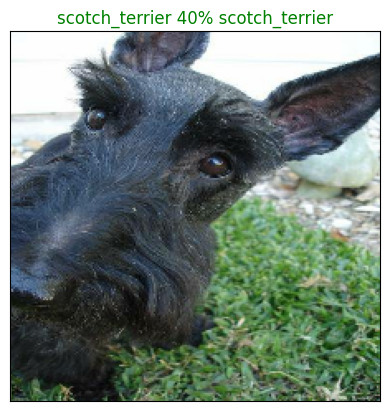

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

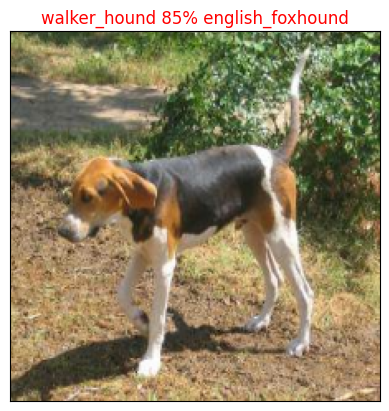

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Now we've got one function to visualize our model's top prediction. Let's make a function to view the model's top 10 predictions.

This function will:
* Take an input of a probabilities prediction array, a ground truth array, and an integer (indicating which sample)
* Find the predicted label using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indices
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probabilities and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indices
  top_10_pred_indices = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indices]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indices]

  # Set up plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # Change the color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


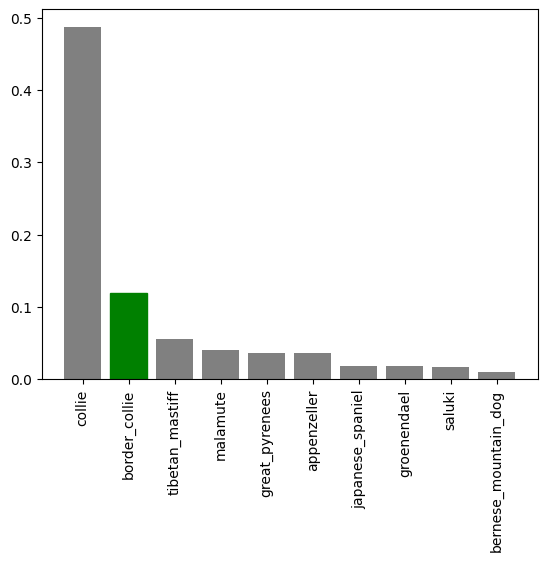

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few examples.

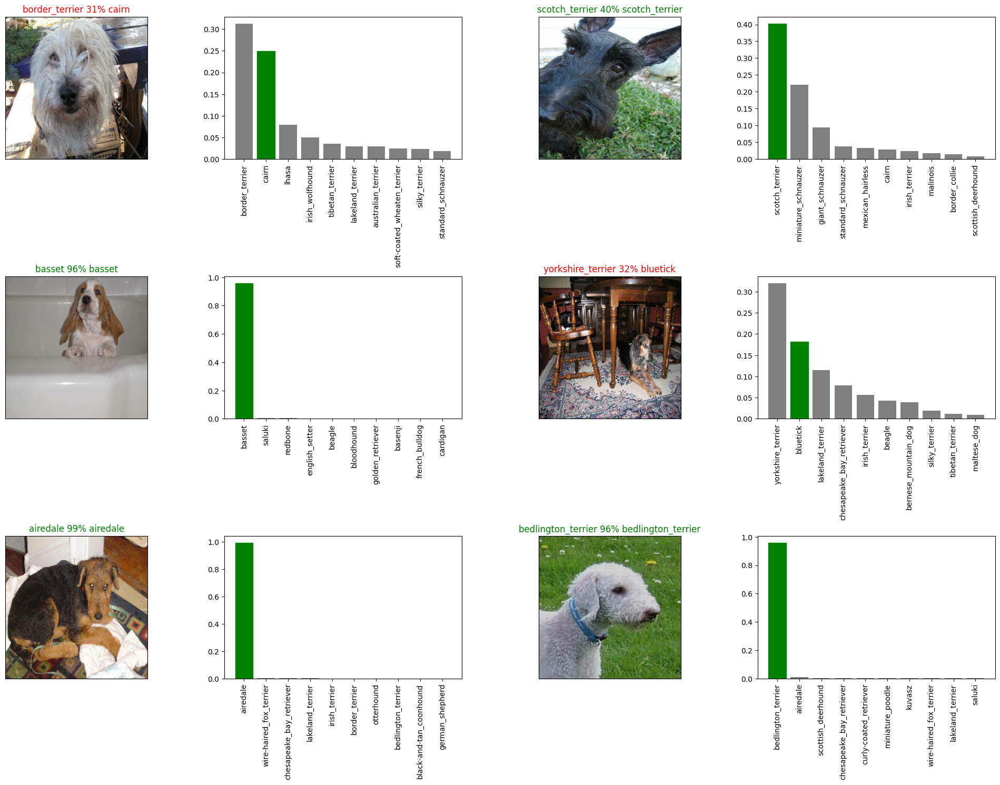

In [ ]:
# Checking a few predictions and their values
i_multiplier = 0 # You can change this value to view different examples
num_rows, num_cols = 3, 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i + i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i + i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()



**Challenge:** How could we create a confusion matrix with the model's predictions and true labels?

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a 'models' directory and append a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%m%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from {model_path}...")
  model = tf_keras.models.load_model(model_path,
                              custom_objects={"KerasLayer": hub.KerasLayer})
  return model

Now let's make sure our `save_model()` and `load_model()` functions work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/models/20260110-03011768015429-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/models/20260110-03011768015429-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model(model_path="drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/models/20260110-03011768015429-1000-images-mobilenetv2-Adam.h5")

Loading saved model from drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/models/20260110-03011768015429-1000-images-mobilenetv2-Adam.h5...


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 2s 243ms/step - loss: 1.2753 - accuracy: 0.6500


[1.2753021717071533, 0.6499999761581421]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 3s 188ms/step - loss: 1.2753 - accuracy: 0.6500


[1.2753021717071533, 0.6499999761581421]

## Training a model on the FULL data

Until now, we wanted to make sure our model actually WORKS by testing it on a subset of data (1000 images). Now that we've verified this, we'll move on to training the model on the FULL data.

In [ ]:
# Creata data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# There's no validation set when training on the full data, so we can't monitor validation accuracy
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

Running the cell below will take a while (especially for the first epoch, but faster afterwards) because the GPU we're using in runtime has to load all the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 52s 143ms/step - loss: 1.3298 - accuracy: 0.6746
Epoch 2/100
320/320 [==============================] - 47s 148ms/step - loss: 0.3997 - accuracy: 0.8807
Epoch 3/100
320/320 [==============================] - 54s 169ms/step - loss: 0.2401 - accuracy: 0.9339
Epoch 4/100
320/320 [==============================] - 50s 155ms/step - loss: 0.1552 - accuracy: 0.9621
Epoch 5/100
320/320 [==============================] - 56s 176ms/step - loss: 0.1064 - accuracy: 0.9777
Epoch 6/100
320/320 [==============================] - 47s 145ms/step - loss: 0.0771 - accuracy: 0.9855
Epoch 7/100
320/320 [==============================] - 52s 163ms/step - loss: 0.0595 - accuracy: 0.9900
Epoch 8/100
320/320 [==============================] - 52s 161ms/step - loss: 0.0458 - accuracy: 0.9952
Epoch 9/100
320/320 [==============================] - 57s 178ms/step - loss: 0.0372 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 55s 172m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/models/20260110-03011768017232-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/models/20260110-03011768017232-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model("drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/models/20260110-03011768017232-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/models/20260110-03011768017232-full-image-set-mobilenetv2-Adam.h5...


## Making predictions on the test dataset

Since we trained our model on images in the form of Tensor batches, we'll have to get our test data in the same format.

Luckly we created the function `create_tensor_batches()` earlier, which takes a list of filenames as input and converts them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels)
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/test/e752d87634c6177a748d655a55aeec89.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/test/dd2228d2fbb3ddc8fb350106c2d989ef.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/test/e7f95aabf775a636b3893ffa120adaf9.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/test/e60df508ef9f70f9c556003827827234.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/test/e2ef94a22af1d5375132de4eb19d2a64.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/test/dcd3cfe0cd6d363a3ed21639c434c8d3.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/test/e52a4321a8cb0dd3bcc8f4a68b75eee7.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/test/e5560686ee44dc59dbb99d6ef4ea54d8.jpg',
 'drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/test/e783e22d4f370b6cc0b1f44b4d6584a8.jpg',
 'drive/My

In [ ]:
# Create test data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run.

In [ ]:
# Make predictions on test data using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 3878s 12s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for later access)
np.savetxt("drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/test_preds_array.csv",
           test_predictions,
           delimiter=",")

In [ ]:
# Load predictions (NumPy) array from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/test_preds_array.csv",
                              delimiter=",")
test_predictions[:10]

array([[5.01130915e-09, 2.47792037e-10, 1.05656761e-10, ...,
        3.98806379e-12, 1.25548361e-09, 4.89899854e-08],
       [1.49737787e-07, 5.18906584e-10, 1.26928130e-08, ...,
        6.21827745e-09, 6.11584483e-07, 5.48913958e-05],
       [4.08335507e-01, 6.65139188e-09, 2.98982421e-08, ...,
        2.72824624e-10, 3.74248366e-08, 3.08661329e-05],
       ...,
       [2.46001418e-12, 1.10684378e-12, 2.01561805e-11, ...,
        8.33897118e-10, 3.01279677e-08, 1.58682312e-09],
       [3.95983939e-08, 5.62362622e-11, 3.71368607e-08, ...,
        2.48714205e-05, 5.01923836e-10, 2.41907205e-09],
       [5.50787220e-08, 3.56736288e-13, 5.18958254e-09, ...,
        9.21131671e-10, 1.38788803e-08, 2.49517118e-09]])

## Preparing test dataset predictions for Kaggle

Now we'll practicing formatting our predictions. The submission file is to be in the format of a DataFrame with an ID column and a column for each unique dog breed.
www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get our data in this format, we'll:
* Create a Pandas DataFrame with the required columns
* Add data to the ID column by extracting the test image IDs from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a csv

In [ ]:
# Create a Pandas DataFrame
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds),
                        )

In [ ]:
# Append test image IDs to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:10]

['e752d87634c6177a748d655a55aeec89',
 'dd2228d2fbb3ddc8fb350106c2d989ef',
 'e7f95aabf775a636b3893ffa120adaf9',
 'e60df508ef9f70f9c556003827827234',
 'e2ef94a22af1d5375132de4eb19d2a64',
 'dcd3cfe0cd6d363a3ed21639c434c8d3',
 'e52a4321a8cb0dd3bcc8f4a68b75eee7',
 'e5560686ee44dc59dbb99d6ef4ea54d8',
 'e783e22d4f370b6cc0b1f44b4d6584a8',
 'dd51cac7c6e1e091b26545aec86dabf3']

In [ ]:
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e752d87634c6177a748d655a55aeec89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dd2228d2fbb3ddc8fb350106c2d989ef,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7f95aabf775a636b3893ffa120adaf9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e60df508ef9f70f9c556003827827234,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e2ef94a22af1d5375132de4eb19d2a64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e752d87634c6177a748d655a55aeec89,5.011309e-09,2.477920e-10,1.056568e-10,1.546122e-13,6.648622e-10,1.885280e-12,1.579707e-10,1.411567e-10,3.128929e-09,...,2.188027e-08,3.281540e-10,9.380977e-10,1.640017e-12,1.122889e-09,1.761698e-11,3.174219e-07,3.988064e-12,1.255484e-09,4.898999e-08
1,dd2228d2fbb3ddc8fb350106c2d989ef,1.497378e-07,5.189066e-10,1.269281e-08,5.308361e-07,6.085782e-07,4.615859e-10,2.929424e-03,2.973166e-07,9.043779e-09,...,3.087685e-07,2.259643e-03,1.294819e-06,9.789462e-09,9.806894e-10,8.902782e-10,3.714053e-05,6.218277e-09,6.115845e-07,5.489140e-05
2,e7f95aabf775a636b3893ffa120adaf9,4.083355e-01,6.651392e-09,2.989824e-08,2.892222e-11,1.187127e-07,2.096532e-10,3.944515e-07,6.259355e-09,3.258018e-09,...,2.104221e-05,6.424413e-08,4.566919e-08,2.686391e-09,6.553278e-08,3.581393e-10,3.702013e-10,2.728246e-10,3.742484e-08,3.086613e-05
3,e60df508ef9f70f9c556003827827234,1.226910e-11,2.019147e-12,9.223768e-07,3.861486e-11,1.868592e-12,3.517706e-08,1.066142e-07,1.078794e-08,1.864042e-09,...,1.089062e-11,4.132057e-09,8.545840e-09,4.394726e-06,9.874206e-10,1.481548e-08,2.384748e-08,1.271209e-10,4.803701e-10,3.314821e-10
4,e2ef94a22af1d5375132de4eb19d2a64,3.588674e-10,1.928059e-09,3.876516e-10,3.203920e-07,1.987356e-08,2.822076e-08,2.046436e-08,2.856969e-06,6.706076e-03,...,1.489659e-08,1.605798e-08,3.720646e-06,6.517645e-04,5.083375e-07,4.771328e-07,6.690262e-08,9.859470e-08,2.136528e-06,2.583432e-08


In [ ]:
# Export completed DataFrame to csv
preds_df.to_csv("drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/full_model_predictions_submission_1_mobilenetv2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images
* Turn the filepaths into data batches using `create_data_batches()`. Since these images won't have labels, we'll set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog-Breed-Identification/dog_breed_identification/custom_images/"
custom_dog_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_dog_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['wire-haired_fox_terrier', 'samoyed', 'miniature_poodle', 'saint_bernard']

In [ ]:
# Get custom images (the unbatchify() function won't work since there are no labels... might improve it later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

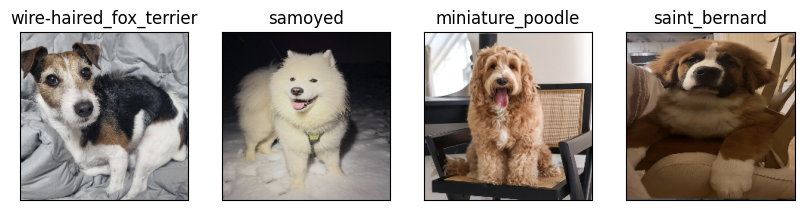

In [ ]:
# Check custom image predictions... might want to fix plot functions to enable plotting without label
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i + 1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)